In [1]:
import graphviz.backend as be

In [2]:
from sklearn.datasets import load_iris
from IPython.display import Image, display_svg, SVG
from sklearn.datasets import load_iris
from sklearn.tree import DecisionTreeClassifier
from dtreeviz import model, dtreeviz

In [3]:
# Load data
iris = load_iris()
X = iris.data
y = iris.target

# Train classifier
clf = DecisionTreeClassifier()
clf.fit(X, y)

DecisionTreeClassifier()

[Text(0.5, 0.9166666666666666, 'x[3] <= 0.8\ngini = 0.667\nsamples = 150\nvalue = [50, 50, 50]'),
 Text(0.4230769230769231, 0.75, 'gini = 0.0\nsamples = 50\nvalue = [50, 0, 0]'),
 Text(0.46153846153846156, 0.8333333333333333, 'True  '),
 Text(0.5769230769230769, 0.75, 'x[3] <= 1.75\ngini = 0.5\nsamples = 100\nvalue = [0, 50, 50]'),
 Text(0.5384615384615384, 0.8333333333333333, '  False'),
 Text(0.3076923076923077, 0.5833333333333334, 'x[2] <= 4.95\ngini = 0.168\nsamples = 54\nvalue = [0, 49, 5]'),
 Text(0.15384615384615385, 0.4166666666666667, 'x[3] <= 1.65\ngini = 0.041\nsamples = 48\nvalue = [0, 47, 1]'),
 Text(0.07692307692307693, 0.25, 'gini = 0.0\nsamples = 47\nvalue = [0, 47, 0]'),
 Text(0.23076923076923078, 0.25, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 1]'),
 Text(0.46153846153846156, 0.4166666666666667, 'x[3] <= 1.55\ngini = 0.444\nsamples = 6\nvalue = [0, 2, 4]'),
 Text(0.38461538461538464, 0.25, 'gini = 0.0\nsamples = 3\nvalue = [0, 0, 3]'),
 Text(0.5384615384615384, 0.25, '

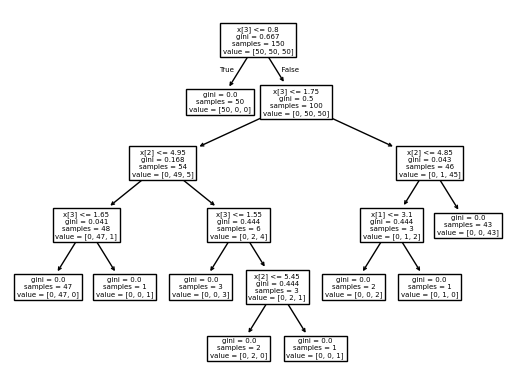

In [4]:
from sklearn.tree import plot_tree
plot_tree(clf)

# Classification

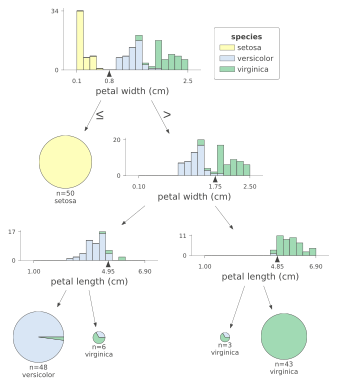

In [72]:
import pandas as pd
from sklearn.datasets import load_iris

# Load fresh iris data to ensure no NaNs are present
iris = load_iris()
X = iris.data
y = iris.target

# Visualize
viz = model(clf, pd.DataFrame(X, columns=iris.feature_names), pd.Series(y),
            feature_names=iris.feature_names,
            target_name="species",
            class_names=["setosa", "versicolor", "virginica"])

viz.view()

# Regression

In [6]:
from sklearn.datasets import fetch_california_housing
from sklearn.tree import DecisionTreeRegressor
from dtreeviz import model

housing = fetch_california_housing()
X = housing.data
y = housing.target

regr = DecisionTreeRegressor(max_depth=1)
regr.fit(X, y)


viz = model(
    regr,
    X,
    y,
    target_name='price',
    feature_names=housing.feature_names,
)
viz.view()

# Horizontal Decision Tree

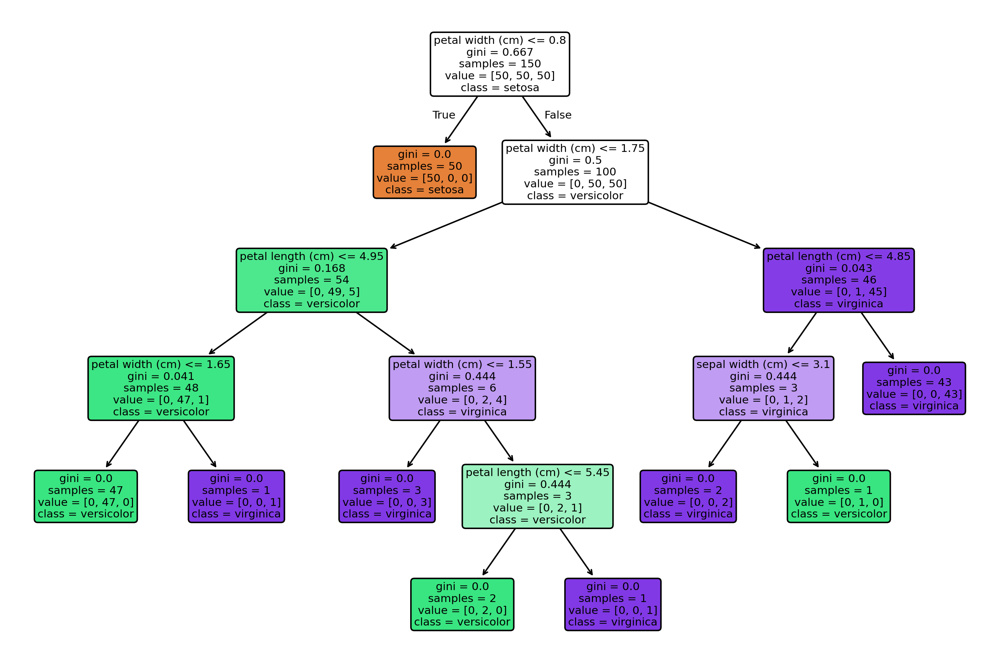

In [74]:
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree
from sklearn.datasets import load_iris
from sklearn.tree import DecisionTreeClassifier

# Load data (reloading to ensure fresh data)
iris = load_iris()
X = iris.data
y = iris.target

# Train classifier (re-training in case clf was modified elsewhere)
clf = DecisionTreeClassifier()
clf.fit(X, y)

plt.figure(figsize=(12, 8), dpi=300)
plot_tree(clf,
          feature_names=iris.feature_names,
          class_names=iris.target_names,
          filled=True,
          rounded=True)
plt.show()

# Show prediction path

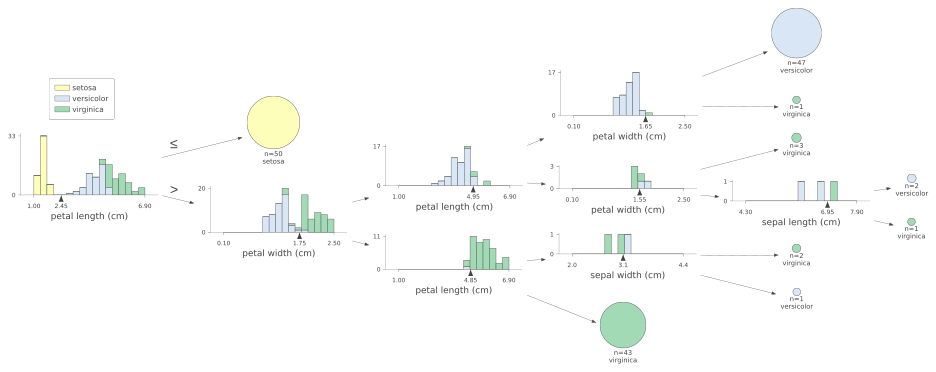

In [46]:
import numpy as np
from sklearn.tree import DecisionTreeClassifier
from sklearn.datasets import load_iris
from dtreeviz import model, dtreeviz # Import dtreeviz

clas = DecisionTreeClassifier()
iris = load_iris()

X_train = iris.data
y_train = iris.target
clas.fit(X_train, y_train)

# Ensure X_instance is a 2D NumPy array for a single instance
X_instance = iris.data[[np.random.randint(0, len(iris.data))]]

# Get the decision path for the instance
decision_path = clas.decision_path(X_instance)
# Extract node IDs from the decision path
node_ids = decision_path.indices[decision_path.indptr[0]:decision_path.indptr[0 + 1]]

# Visualize with highlighted path
viz = model(clas, # Use dtreeviz function
               X_train, # Explicitly pass X_train
               y_train,
               feature_names=iris.feature_names,
               class_names=["setosa", "versicolor", "virginica"],
               )
viz.view(orientation='LR') # Display the visualization

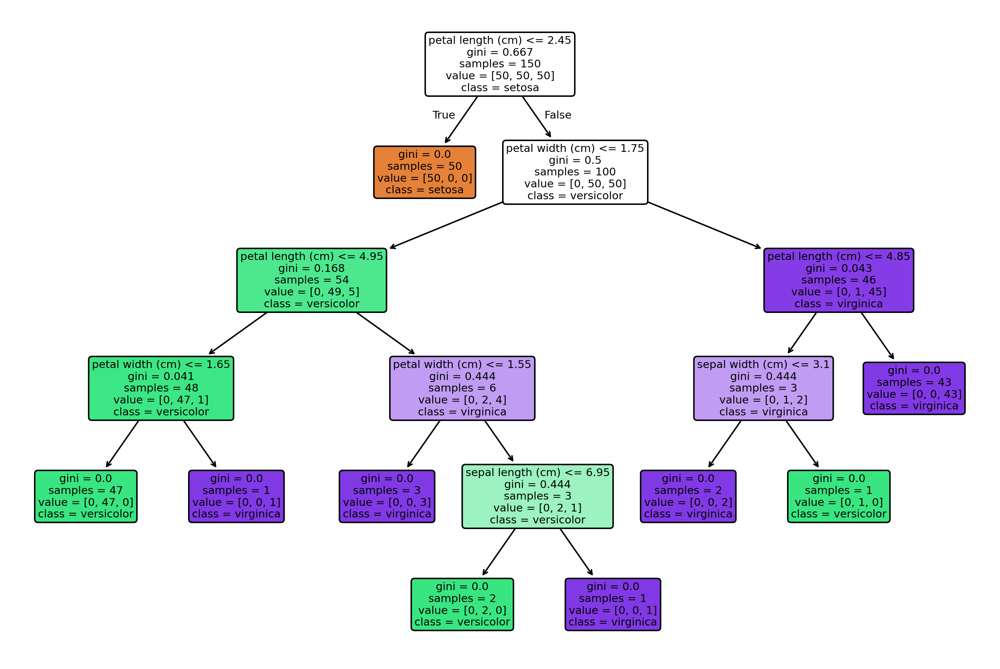

In [25]:
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 8), dpi=300)
plot_tree(clas,
          feature_names=iris.feature_names,
          class_names=["setosa", "versicolor", "virginica"],
          filled=True,
          rounded=True)
plt.show()

#  Show node number

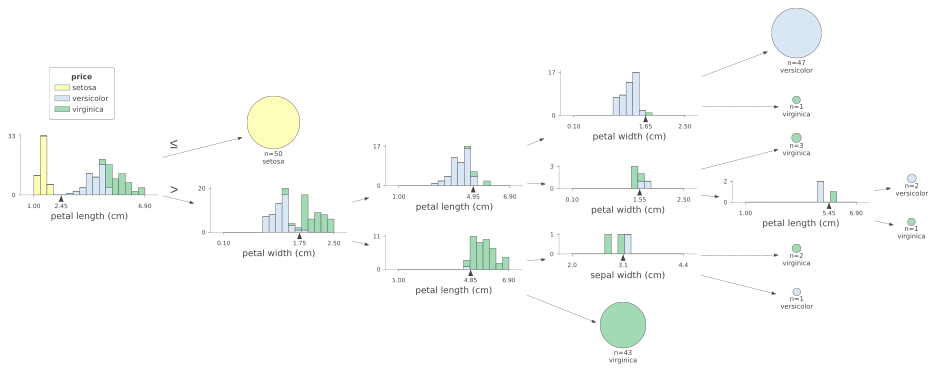

In [45]:
viz = model(clas,
               X_train,
               y_train,
               target_name='price',
               feature_names=iris.feature_names,
               class_names=["setosa", "versicolor", "virginica"],
            )
viz.view(orientation='LR')

# Without Any graphs

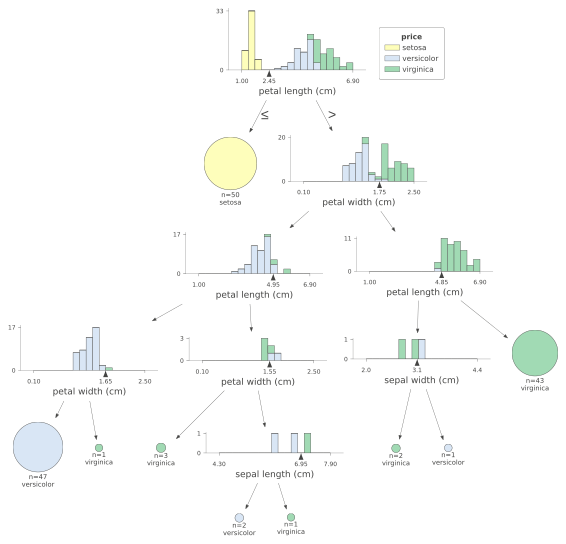

In [49]:
viz = model(clas,
               X_train,
               y_train,
               target_name='price',
               feature_names=iris.feature_names,
               class_names=["setosa", "versicolor", "virginica"],
               )
viz.view()

#  Show just prediction path, nothing else

In [56]:
clas = tree.DecisionTreeClassifier()
iris = load_iris()

X_train = iris.data
y_train = iris.target
clas.fit(X_train, y_train)

X = iris.data[np.random.randint(0, len(iris.data)),:]

viz = model(clas,
               X_train,
               y_train,
               target_name='price',
               feature_names=iris.feature_names,
               class_names=["setosa", "versicolor", "virginica"],
               X=X,
               show_just_path=True)
viz

TypeError: model() got an unexpected keyword argument 'X'

# Prediction Path in Plain english

In [75]:
from dtreeviz import explain_prediction_path
from sklearn.datasets import load_iris
from sklearn.tree import DecisionTreeClassifier
import numpy as np

# Load data and train classifier to ensure variables are defined
iris = load_iris()
X_train = iris.data
y_train = iris.target
clas = DecisionTreeClassifier()
clas.fit(X_train, y_train)

# Select a random instance for explanation
X_instance = X_train[np.random.randint(0, len(X_train)), :]

print(explain_prediction_path(clas, X_instance, feature_names=iris.feature_names, explanation_type="plain_english"))

4.85 <= petal length (cm) 
1.75 <= petal width (cm) 



/tmp/ipython-input-75-3085005989.py:16: DeprecationWarning: explain_prediction_path() function is deprecated starting from version 2.0. 
 For the same functionality, please use this code instead: 
 m = dtreeviz.model(...) 
 m.explain_prediction_path()


# Feature Importance

Instance Feature Importance (sklearn_default):
None


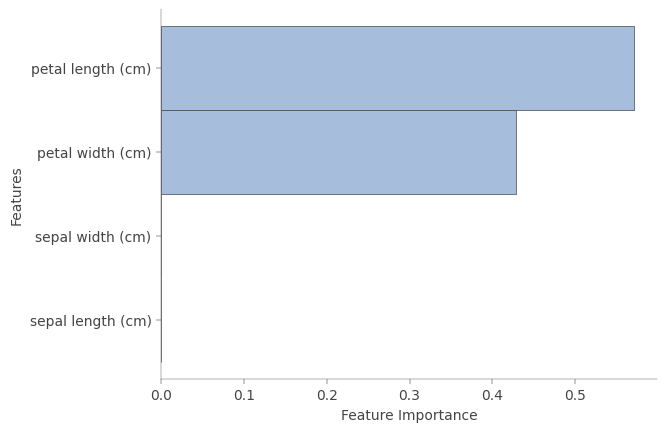

In [77]:
from dtreeviz import model, dtreeviz # Import model and dtreeviz
from sklearn.datasets import load_iris
from sklearn.tree import DecisionTreeClassifier
import numpy as np # Import numpy

# Load data and train classifier to ensure 'clas' and 'iris' are defined
iris = load_iris()
X_train = iris.data
y_train = iris.target
clas = DecisionTreeClassifier()
clas.fit(X_train, y_train)

# Select a random instance for explanation
X_instance = X_train[np.random.randint(0, len(X_train)), :]

# Use the recommended approach to get instance feature importance
viz_model = model(clas,
                   X_train,
                   y_train,
                   feature_names=iris.feature_names,
                   class_names=["setosa", "versicolor", "virginica"])

feature_importance = viz_model.instance_feature_importance(X_instance)

print("Instance Feature Importance (sklearn_default):")
print(feature_importance)

# Univariate Regression

/tmp/ipython-input-65-3436226494.py:15: DeprecationWarning: rtreeviz_univar() function is deprecated starting from version 2.0. 
 For the same functionality, please use this code instead: 
 m = dtreeviz.model(...) 
 m.rtree_feature_space(...)
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names


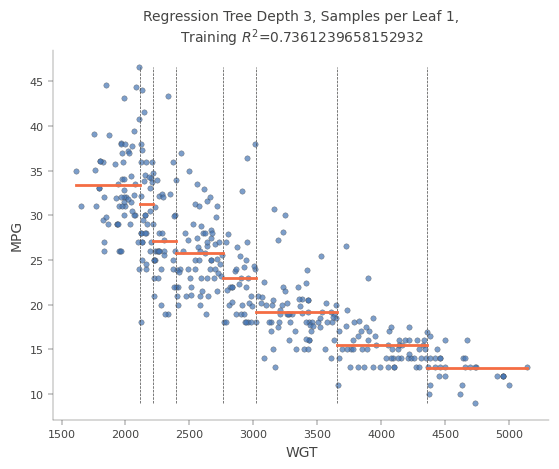

In [65]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeRegressor
# Import rtreeviz_univar directly from the top-level dtreeviz package
from dtreeviz import rtreeviz_univar

df_cars = pd.read_csv("cars.csv")
X, y = df_cars[['WGT']], df_cars['MPG']

dt = DecisionTreeRegressor(max_depth=3, criterion="squared_error")
dt.fit(X, y)

fig = plt.figure()
ax = fig.gca()
rtreeviz_univar(dt, X, y, 'WGT', 'MPG', ax=ax)
plt.show()

# 3-D Regression

In [66]:
import pandas as pd
import os

file_path = "cars.csv"

# Check if the file exists, if not, download it
if not os.path.exists(file_path):
  print(f"{file_path} not found. Downloading...")
  !wget https://raw.githubusercontent.com/parrt/dtreeviz/master/data/cars.csv
  print(f"{file_path} downloaded.")

df_cars = pd.read_csv(file_path)

df_cars

,MPG,CYL,ENG,WGT
0,18.0,8,307.0,3504
1,15.0,8,350.0,3693
2,18.0,8,318.0,3436
3,16.0,8,304.0,3433
4,17.0,8,302.0,3449
...,...,...,...,...
387,27.0,4,140.0,2790
388,44.0,4,97.0,2130
389,32.0,4,135.0,2295
390,28.0,4,120.0,2625


/tmp/ipython-input-68-1640613907.py:31: DeprecationWarning: dtreeviz() function is deprecated starting from version 2.0. 
 For the same functionality, please use this code instead: 
 m = dtreeviz.model(...) 
 m.view()


TypeError: 'int' object is not subscriptable

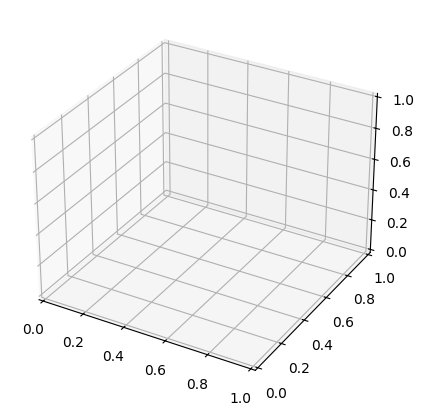

In [68]:
import pandas as pd
import os
from mpl_toolkits.mplot3d import Axes3D
from sklearn.tree import DecisionTreeRegressor
# Import dtreeviz model
from dtreeviz import dtreeviz
import matplotlib.pyplot as plt # Import matplotlib.pyplot

file_path = "cars.csv"

# Check if the file exists, if not, download it
if not os.path.exists(file_path):
  print(f"{file_path} not found. Downloading...")
  !wget https://raw.githubusercontent.com/parrt/dtreeviz/master/data/cars.csv
  print(f"{file_path} downloaded.")

df_cars = pd.read_csv(file_path)


X = df_cars[['WGT','ENG']]
y = df_cars['MPG']

dt = DecisionTreeRegressor(max_depth=3, criterion="squared_error")
dt.fit(X, y)

figsize = (6,5)
fig = plt.figure(figsize=figsize)
ax = fig.add_subplot(111, projection='3d')

# Use the recommended approach with dtreeviz.model
model_viz = dtreeviz(
    dt,
    X,
    y,
    feature_names=['Vehicle Weight', 'Horse Power'],
    target_name='MPG',
)

model_viz.rtree_feature_space3D(
    ax=ax,
    fontsize=14,
    elev=20,
    azim=25,
    dist=8.2,
    show={'splits','title'},
)

plt.show()

In [60]:
!wget https://raw.githubusercontent.com/parrt/dtreeviz/master/data/cars.csv

--2025-07-27 12:56:16--  https://raw.githubusercontent.com/parrt/dtreeviz/master/data/cars.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 5996 (5.9K) [text/plain]
Saving to: ‘cars.csv’

cars.csv            100%[===================>]   5.86K  --.-KB/s    in 0s      

2025-07-27 12:56:16 (59.9 MB/s) - ‘cars.csv’ saved [5996/5996]



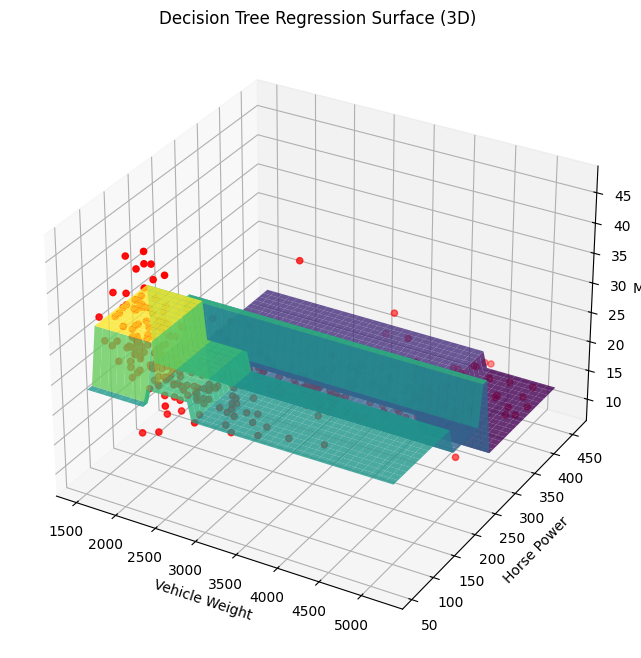

In [70]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.tree import DecisionTreeRegressor
import pandas as pd

# Load data
df_cars = pd.read_csv("cars.csv")
X = df_cars[['WGT','ENG']]
y = df_cars['MPG']

# Train the regression tree model
regr = DecisionTreeRegressor(max_depth=3, criterion="squared_error")
regr.fit(X, y)

# Create a meshgrid for plotting the surface
wgt_min, wgt_max = X['WGT'].min() - 100, X['WGT'].max() + 100
eng_min, eng_max = X['ENG'].min() - 10, X['ENG'].max() + 10
wgt_grid, eng_grid = np.meshgrid(np.arange(wgt_min, wgt_max, 50),
                                 np.arange(eng_min, eng_max, 10))

# Prepare data for prediction as a DataFrame with feature names
X_pred = pd.DataFrame({'WGT': wgt_grid.ravel(), 'ENG': eng_grid.ravel()})

# Predict on the meshgrid
Z = regr.predict(X_pred)
Z = Z.reshape(wgt_grid.shape)

# Plot the 3D surface
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(wgt_grid, eng_grid, Z, cmap=plt.cm.viridis, alpha=0.8)

# Plot the actual data points
ax.scatter(X['WGT'], X['ENG'], y, color='red', s=20)

ax.set_xlabel('Vehicle Weight')
ax.set_ylabel('Horse Power')
ax.set_zlabel('MPG')
ax.set_title('Decision Tree Regression Surface (3D)')

plt.show()

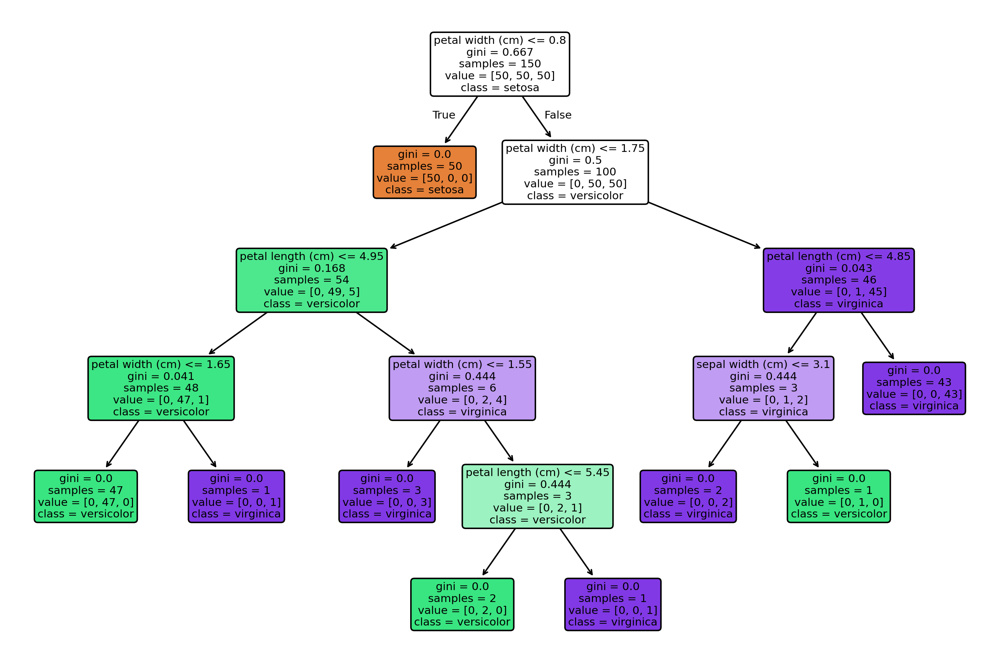

In [73]:
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree
from sklearn.datasets import load_iris
from sklearn.tree import DecisionTreeClassifier

# Load data (reloading to ensure fresh data)
iris = load_iris()
X = iris.data
y = iris.target

# Train classifier (re-training in case clf was modified elsewhere)
clf = DecisionTreeClassifier()
clf.fit(X, y)

plt.figure(figsize=(12, 8), dpi=300)
plot_tree(clf,
          feature_names=iris.feature_names,
          class_names=iris.target_names,
          filled=True,
          rounded=True)
plt.show()

In [78]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.datasets import load_iris
import pandas as pd

# Load data and train classifier to ensure 'clas' and 'iris' are defined
iris = load_iris()
X_train = iris.data
y_train = iris.target
clas = DecisionTreeClassifier()
clas.fit(X_train, y_train)

# Get global feature importances from the trained model
global_feature_importance = clas.feature_importances_

# Create a pandas Series for better readability
feature_names = iris.feature_names
feature_importance_series = pd.Series(global_feature_importance, index=feature_names)

print("Global Feature Importance:")
print(feature_importance_series)

Global Feature Importance:
sepal length (cm)    0.013333
sepal width (cm)     0.000000
petal length (cm)    0.564056
petal width (cm)     0.422611
dtype: float64
